<a href="https://colab.research.google.com/github/thaodo2512/airc-rl-agent/blob/thao%2Frobot/notebooks/colabo/VAE_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN VAE for SRL for DIY Self driving car

In this notebook you will learn the CNN VAE(beta) model. The result model is used for state representation in reinforcement learning.

First collection training data. you can use notebooks\utility\data_collection.ipynb

Collect images of the course while driving the car on the course. Collect 1k to 10k images. Adjust the number of data collected according to the size of the course. When running the course, run in the center of the course, the side of the side line, zigzag running, etc. During the trial during reinforcement learning, you do not know how to run on the course. Collect data so that the course can be represented in the event of an error.


## Installing TensorBoardX

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.0 MB/s eta 0:00:00


## Mount google drive

You upload zip file that contain training data. The zip file copy from googledrive.
Set zip file name to DATASET_ZIP.

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
import os
DATASET_FILE = 'jetbot_dataset_2025-12-05_13-50-12.zip'
DATASET_DIR = 'dataset'
DATASET_ZIP = os.path.join(DATASET_DIR, DATASET_FILE)
!ls /content/drive/MyDrive/dataset/

jetbot_dataset_2025-12-05_13-50-12.zip


## Copy from google drive

Copy training data and unzip.

In [22]:
!rm -rf dataset_root
!cp '/content/drive/MyDrive/{DATASET_ZIP}' ./
!unzip -q $DATASET_FILE

!mkdir dataset_root
!mv $DATASET_DIR './dataset_root'

## Import module

In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.utils import save_image
from IPython.display import Image
from IPython.core.display import Image, display

# %load_ext autoreload
# %autoreload 2

## Load GPU device

In [25]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Load dataset



In [26]:
bs = 64
dataset = datasets.ImageFolder(root='./dataset_root', transform=transforms.Compose([
    torchvision.transforms.Resize((120, 160)),
    torchvision.transforms.Lambda(lambda x: x.crop((0, 40, 160, 120))),
    transforms.ToTensor(),
]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=bs, shuffle=True,  num_workers=2, pin_memory=True)
len(dataset.imgs), len(dataloader)

(1021, 16)

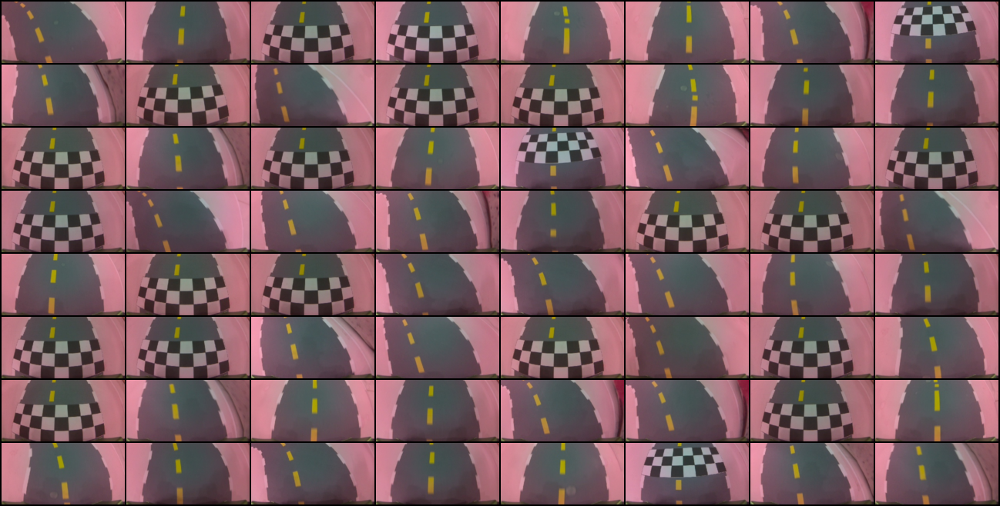

In [27]:
fixed_x, _ = next(iter(dataloader))
save_image(fixed_x, 'real_image.png')
Image('real_image.png')

In [ ]:
## Define VAE Network

In [28]:
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)

class UnFlatten(nn.Module):
    def forward(self, input, size=256):
        return input.view(input.size(0), size, 3, 8)


class VAE(nn.Module):
    def __init__(self, image_channels=3, h_dim=6144, z_dim=32):
        super(VAE, self).__init__()
        self.z_dim = z_dim
        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2),
            nn.ReLU(),
            Flatten()
        )

        self.fc1 = nn.Linear(h_dim, z_dim)
        self.fc2 = nn.Linear(h_dim, z_dim)
        self.fc3 = nn.Linear(z_dim, h_dim)

        self.decoder = nn.Sequential(
            UnFlatten(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=5, stride=2),
            nn.ReLU(),
        )

        self.out1 = nn.Sequential(nn.ConvTranspose2d(32, image_channels, kernel_size=4, stride=2),
                                  nn.Sigmoid(),
                                  )
        self.out2 = nn.Sequential(nn.ConvTranspose2d(32, image_channels, kernel_size=4, stride=2),
                                  nn.Sigmoid(),
                                  )

    def reparameterize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        esp = torch.randn(*mu.size()).to(device)
        z = mu + std * esp
        return z

    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)#F.softplus(self.fc2(h))
        z = self.reparameterize(mu, logvar)
        return z, mu, logvar

    def encode(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return z, mu, logvar

    def decode(self, z):
        z = self.fc3(z)
        x = self.decoder(z)
        mu_y = self.out1(x)
        sigma_y = self.out2(x)
        return mu_y, sigma_y

    def forward(self, x):
        z, mu, logvar = self.encode(x)
        mu_y, sigma_y = self.decode(z)
        return mu_y, sigma_y, mu, logvar

    def loss_fn(self, image, mu_y, sigma_y, mean, logvar):
        m_vae_loss = (mu_y - image)**2 /sigma_y
        m_vae_loss = 0.5 * torch.sum(m_vae_loss)
        a_vae_loss = torch.log(2.0 * torch.pi * sigma_y)
        a_vae_loss = 0.5 * torch.sum(a_vae_loss)
        KL = -0.5 * torch.sum((1 + logvar - mean.pow(2) - logvar.exp()), dim=0)
        KL = torch.mean(KL)
        return torch.mean((KL*5) + (10*m_vae_loss) +  a_vae_loss)


In [30]:
## Prepare Training

# Create VAE model and initialize optimizer.

In [31]:
from torchsummary import summary
VARIANTS_SIZE = 32
image_channels = fixed_x.size(1)
vae = VAE(image_channels=image_channels, z_dim=VARIANTS_SIZE ).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)
summary(vae, (3, 80, 160))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 39, 79]           1,568
              ReLU-2           [-1, 32, 39, 79]               0
            Conv2d-3           [-1, 64, 18, 38]          32,832
              ReLU-4           [-1, 64, 18, 38]               0
            Conv2d-5           [-1, 128, 8, 18]         131,200
              ReLU-6           [-1, 128, 8, 18]               0
            Conv2d-7            [-1, 256, 3, 8]         524,544
              ReLU-8            [-1, 256, 3, 8]               0
           Flatten-9                 [-1, 6144]               0
           Linear-10                   [-1, 32]         196,640
           Linear-11                   [-1, 32]         196,640
           Linear-12                 [-1, 6144]         202,752
        UnFlatten-13            [-1, 256, 3, 8]               0
  ConvTranspose2d-14           [-1, 128

In [32]:
## Tensorboard

In [33]:
%load_ext tensorboard
%tensorboard --logdir ./runs

<IPython.core.display.Javascript object>

In [34]:
## Start training

In [35]:
from tensorboardX import SummaryWriter
import numpy as np
epochs = 100
writer = SummaryWriter()

vae.train()
for epoch in range(epochs):
    losses = []
    grid = None
    for idx, (images, _) in enumerate(dataloader):
        images = images.to(device, non_blocking=True)
        optimizer.zero_grad()
        mu_y, sigma_y, mu, logvar = vae(images)
        loss = vae.loss_fn(images, mu_y, sigma_y, mu, logvar)
        loss.backward()
        optimizer.step()
        losses.append(loss.cpu().detach().numpy())
        grid = torchvision.utils.make_grid(mu_y)
        grid_sigma = torchvision.utils.make_grid(sigma_y)
    writer.add_image('Image/reconst', grid, epoch)
    writer.add_image('Image/sigma', grid_sigma, epoch)
    writer.add_scalar('Loss/train',np.average(losses), epoch)
    print("EPOCH: {} loss: {}".format(epoch+1, np.average(losses)))

torch.save(vae.state_dict(), 'vae.torch', _use_new_zipfile_serialization=False)

EPOCH: 1 loss: 2047158.0
EPOCH: 2 loss: 1524749.5
EPOCH: 3 loss: 1395486.5
EPOCH: 4 loss: 1120106.0
EPOCH: 5 loss: 1199891.625
EPOCH: 6 loss: 1047634.4375
EPOCH: 7 loss: 695307.625
EPOCH: 8 loss: 506234.84375
EPOCH: 9 loss: 1090830.5
EPOCH: 10 loss: 1731176.375
EPOCH: 11 loss: 900237.625
EPOCH: 12 loss: 677688.5
EPOCH: 13 loss: 546845.75
EPOCH: 14 loss: 397505.375
EPOCH: 15 loss: 869405.125
EPOCH: 16 loss: 507494.90625
EPOCH: 17 loss: 749192.3125
EPOCH: 18 loss: 319037.625
EPOCH: 19 loss: 18392.4609375
EPOCH: 20 loss: -193928.96875
EPOCH: 21 loss: 538897.5625
EPOCH: 22 loss: 151.3046875
EPOCH: 23 loss: -95496.4140625
EPOCH: 24 loss: -449798.96875
EPOCH: 25 loss: -489715.375
EPOCH: 26 loss: -893637.0625
EPOCH: 27 loss: -1077835.75
EPOCH: 28 loss: -978401.25
EPOCH: 29 loss: -1358690.75
EPOCH: 30 loss: -1323386.625
EPOCH: 31 loss: -1724122.5
EPOCH: 32 loss: -1251882.875
EPOCH: 33 loss: -1727094.125
EPOCH: 34 loss: -1708310.25
EPOCH: 35 loss: -2045753.0
EPOCH: 36 loss: -1658422.375
EPOCH: 

## Visualize latent space
Visualizing latent space by TensorBoard.
You can visualize latent space with TensorBoard Projector view.
The latent spaces are auto labeled by K-means. If similar images stick together, we consider the quality of the latent space to be good.


In [36]:
from sklearn.cluster import KMeans
vae.eval()

latent_spaces = None
for idx,(images, _) in enumerate(dataloader):
    images = images.to(device)
    z, _, _ = vae.encode(images)
    z = z.detach().cpu().numpy()
    if latent_spaces is None:
      latent_spaces = z.copy()
    else:
      latent_spaces = np.append(latent_spaces, z, axis=0)
    if len(latent_spaces) > 5000:
        break

images, sigma_y = vae.decode(torch.Tensor(latent_spaces).to(device))
images = F.interpolate(images, size=(40, 40), mode='bilinear', align_corners=False)

kmeans_model = KMeans(n_clusters=5, verbose=0, n_init=10)
labels = kmeans_model.fit_predict(latent_spaces)

writer.add_embedding(mat=latent_spaces, metadata=labels, label_img=images)
writer.close()

## Re-launch TensorBoard
This cell do kill tensorboard process and re-launch TensorBoardX. When do not show projector tab, click reload button.

In [37]:
!kill $(ps | grep tensorboard | cut -f 1 -d '?')
%tensorboard --logdir ./runs

<IPython.core.display.Javascript object>

In [38]:
## Cleanup

# Copy trained model file to GoogleDrive.

In [39]:
!cp vae.torch '/content/drive/My Drive/vae.torch'